# Music Genre Classification
## 9. AutoML Classification using audio features

<img src='music.jpg' width = 600>

<div class="alert alert-info"> <b> In this notebook we will create an AutoML Classification model using only audio features.</b></div>

Serge Retkowsky | serge.retkowsky@microsoft.com | 21-Mar-2022 | V1

<div class="alert alert-info"><b> Let's use Azure AutoML to classify audio files using audio features extraction.</b></div>

In [1]:
import json
import logging
import pandas as pd
import os
import azureml.core
from azureml.core.experiment import Experiment
from azureml.core.workspace import Workspace
from azureml.core.dataset import Dataset
from azureml.train.automl import AutoMLConfig
from azureml.interpret import ExplanationClient
from matplotlib import pyplot as plt
import requests
from numpy import array
import numpy as np
import datetime
import librosa
import librosa.display
import IPython
import seaborn as sns
import scipy

## 1. Settings

In [2]:
import sys
sys.version

'3.6.9 |Anaconda, Inc.| (default, Jul 30 2019, 19:07:31) \n[GCC 7.3.0]'

In [3]:
print("You are currently using version", azureml.core.VERSION, "of the Azure ML SDK")

You are currently using version 1.34.0 of the Azure ML SDK


In [4]:
ws = Workspace.from_config()

# choose a name for experiment
experiment_name = 'AutoML-MusicGenreClassification'

experiment=Experiment(ws, experiment_name)

output = {}
output['Workspace'] = ws.name
output['Resource Group'] = ws.resource_group
output['Location'] = ws.location
output['Experiment Name'] = experiment.name
pd.set_option('display.max_colwidth', -1)
outputDf = pd.DataFrame(data = output, index = [''])
outputDf.T

Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.


,
Workspace,azuremlvision
Resource Group,azuremlvision-rg
Location,westeurope
Experiment Name,AutoML-MusicGenreClassification


## 2. Saving Audio features CSV and xls files into Azure ML Datastore

In [5]:
# Our audio features extraction files
!ls featuresresults/*.* -lh

-rwxrwxrwx 1 root root 1.4M Mar  2 13:04 featuresresults/musicaudiofeatures.csv
-rwxrwxrwx 1 root root 1.6M Mar  2 13:04 featuresresults/musicaudiofeatures.xls


In [6]:
ds = ws.get_default_datastore()

ds.upload_files(files=['./featuresresults/musicaudiofeatures.csv'], # Upload the diabetes csv files in /data
                       target_path='musicgenreaudiofeatures', # Put it in a folder path in the datastore
                       overwrite=True, # Replace existing files of the same name
                       show_progress=True)

Uploading an estimated of 1 files
Uploading ./featuresresults/musicaudiofeatures.csv
Uploaded ./featuresresults/musicaudiofeatures.csv, 1 files out of an estimated total of 1
Uploaded 1 files


$AZUREML_DATAREFERENCE_f1ad143d8d7c4e998fa8dd4aa035f8d7

## 3. Loading files from the Azure ML datastore

In [7]:
# Load Azure ML datasource
musicaudiofeatures_ds = Dataset.Tabular.from_delimited_files(
    path=ds.path('musicgenreaudiofeatures/musicaudiofeatures.csv'))

In [8]:
# convert datasource to pandas df
musicaudiofeatures_df = musicaudiofeatures_ds.to_pandas_dataframe()

In [9]:
musicaudiofeatures_df.shape

(1000, 84)

In [10]:
# Removing some columns for the model
del musicaudiofeatures_df['Column1']
del musicaudiofeatures_df['fullfilename']
del musicaudiofeatures_df['dirsname']
del musicaudiofeatures_df['filename']
del musicaudiofeatures_df['basename']
del musicaudiofeatures_df['extension']
del musicaudiofeatures_df['sampling_rate']
del musicaudiofeatures_df['total_samples']
del musicaudiofeatures_df['duration']

In [11]:
musicaudiofeatures_df.shape

(1000, 75)

In [12]:
musicaudiofeatures_df.columns

Index(['category', 'chroma_mean_0', 'chroma_mean_1', 'chroma_mean_2',
       'chroma_mean_3', 'chroma_mean_4', 'chroma_mean_5', 'chroma_mean_6',
       'chroma_mean_7', 'chroma_mean_8', 'chroma_mean_9', 'chroma_mean_10',
       'chroma_mean_11', 'chroma_std_0', 'chroma_std_1', 'chroma_std_2',
       'chroma_std_3', 'chroma_std_4', 'chroma_std_5', 'chroma_std_6',
       'chroma_std_7', 'chroma_std_8', 'chroma_std_9', 'chroma_std_10',
       'chroma_std_11', 'mfccs_mean_0', 'mfccs_mean_1', 'mfccs_mean_2',
       'mfccs_mean_3', 'mfccs_mean_4', 'mfccs_mean_5', 'mfccs_mean_6',
       'mfccs_mean_7', 'mfccs_mean_8', 'mfccs_mean_9', 'mfccs_mean_10',
       'mfccs_mean_11', 'mfccs_mean_12', 'mfccs_std_0', 'mfccs_std_1',
       'mfccs_std_2', 'mfccs_std_3', 'mfccs_std_4', 'mfccs_std_5',
       'mfccs_std_6', 'mfccs_std_7', 'mfccs_std_8', 'mfccs_std_9',
       'mfccs_std_10', 'mfccs_std_11', 'mfccs_std_12', 'cent_mean', 'cent_std',
       'cent_skew', 'contrast_mean_0', 'contrast_mean_1', 'cont

In [13]:
musicaudiofeatures_df

,category,chroma_mean_0,chroma_mean_1,chroma_mean_2,chroma_mean_3,chroma_mean_4,chroma_mean_5,chroma_mean_6,chroma_mean_7,chroma_mean_8,...,contrast_std_4,contrast_std_5,contrast_std_6,rolloff_mean,rolloff_std,rolloff_skew,zrate_mean,zrate_std,zrate_skew,tempo
0,genres/blues,0.268007,0.251611,0.226005,0.095506,0.218374,0.284539,0.331698,0.357314,0.194936,...,4.049205,2.225948,2.163108,3805.839606,949.476395,949.476395,0.070435,0.024249,0.890262,123.046875
1,genres/blues,0.245332,0.119801,0.153988,0.053337,0.150663,0.250578,0.322281,0.541648,0.297068,...,4.701318,3.809115,5.004282,3550.522098,1725.657379,1725.657379,0.044427,0.030633,1.921759,67.999589
2,genres/blues,0.044975,0.053335,0.213919,0.299786,0.451331,0.170569,0.227765,0.221921,0.193539,...,4.225142,3.051108,3.191152,3042.260232,885.457204,885.457204,0.064752,0.025841,1.677929,161.499023
3,genres/blues,0.149017,0.095013,0.256969,0.361600,0.515326,0.284189,0.081642,0.063560,0.065608,...,3.839645,2.869564,3.706476,2184.745799,1221.963322,1221.963322,0.024861,0.015907,0.834285,117.453835
4,genres/blues,0.149890,0.324410,0.231448,0.049297,0.309212,0.439482,0.060133,0.114162,0.145208,...,4.448131,4.207953,4.630709,3579.757627,1254.184130,1254.184130,0.085567,0.033966,2.602187,135.999178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,genres/rock,0.091698,0.150276,0.618177,0.080381,0.133679,0.043792,0.232921,0.321196,0.109188,...,3.872759,2.823396,2.530984,4253.557033,1105.631374,1105.631374,0.066450,0.022923,0.595465,103.359375
996,genres/rock,0.083717,0.357250,0.204694,0.073174,0.398913,0.043578,0.135344,0.104976,0.273856,...,2.566746,1.991199,2.939157,4149.338328,1023.044874,1023.044874,0.080026,0.023372,-0.653654,117.453835
997,genres/rock,0.129040,0.138378,0.341563,0.139865,0.256904,0.073339,0.270752,0.316411,0.162150,...,3.048757,2.787203,2.459710,4031.405321,896.780597,896.780597,0.103808,0.029590,-0.571100,129.199219
998,genres/rock,0.412445,0.197487,0.222616,0.112004,0.199586,0.226256,0.145480,0.411285,0.133741,...,4.192363,3.085916,4.712941,3015.631004,1154.431334,1154.431334,0.036359,0.021406,1.555821,112.347147


## 4. Decision Tree classification with sci-kit learn to predict music genre

In [14]:
from sklearn.model_selection import train_test_split

# Partionning the dataset
X_train, X_test, y_train, y_test = train_test_split(musicaudiofeatures_df.drop('category',axis=1), 
                                                    musicaudiofeatures_df['category'], test_size=0.2, 
                                                    random_state=12345)

In [15]:
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier()
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

In [16]:
from sklearn.metrics import classification_report, confusion_matrix

print("Decision Tree Confusion Matrix:\n")
print("\033[1;31;34m", confusion_matrix(y_test, y_pred))

Decision Tree Confusion Matrix:

 [[ 8  0  1  3  0  0  1  0  1  0]
 [ 0 21  1  2  0  5  0  0  0  0]
 [ 5  0  5  4  0  1  0  0  0  6]
 [ 1  0  2  6  2  0  0  3  2  3]
 [ 0  0  1  3  9  0  1  0  3  3]
 [ 2  3  2  1  0 10  0  1  0  0]
 [ 0  0  0  1  2  1 12  0  0  0]
 [ 1  0  2  2  2  0  0 12  3  0]
 [ 0  2  1  2  3  2  0  1  6  0]
 [ 1  0  3  4  1  3  1  3  1  6]]


<IPython.core.display.Javascript object>


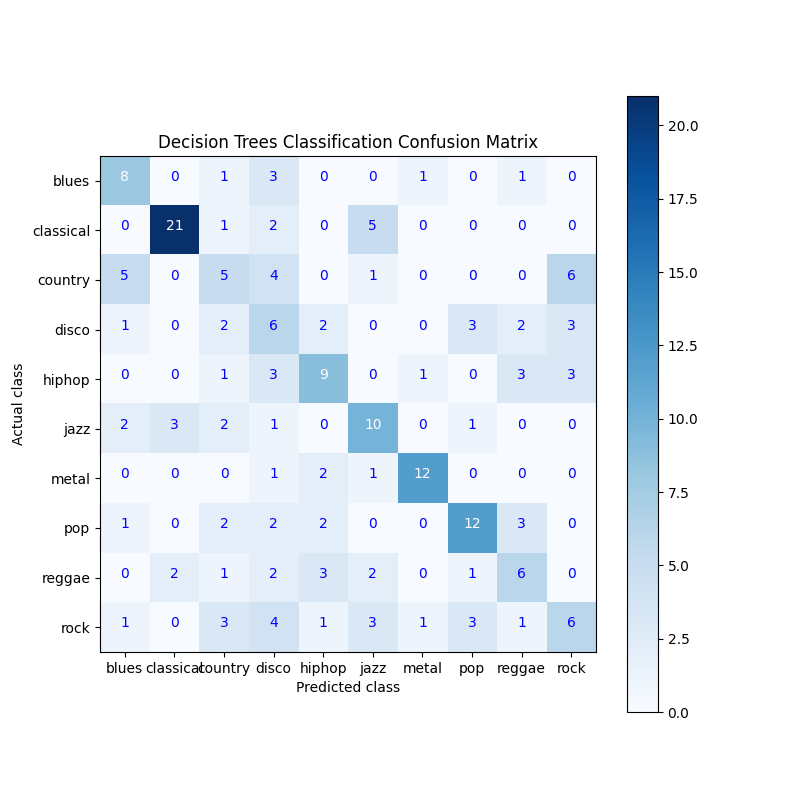

In [17]:
%matplotlib notebook
from sklearn.metrics import confusion_matrix
import itertools

plt.figure(figsize=(8, 8))
cf = confusion_matrix(y_test, y_pred)
plt.imshow(cf,cmap=plt.cm.Blues, interpolation='nearest')
plt.colorbar()
plt.title('Decision Trees Classification Confusion Matrix')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')

class_labels = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']

tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels)
plt.yticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], 
           ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock'])

thresh = cf.max() / 3.

for i,j in itertools.product(range(cf.shape[0]),range(cf.shape[1])):
    plt.text(j,i,format(cf[i,j],'d'), horizontalalignment='center', color='white' if cf[i,j] >thresh else 'blue')

plt.show()

In [18]:
print("Decision Tree Classification report:\n")
print(classification_report(y_test, y_pred, digits=3))

Decision Tree Classification report:

                  precision    recall  f1-score   support

    genres/blues      0.444     0.571     0.500        14
genres/classical      0.808     0.724     0.764        29
  genres/country      0.278     0.238     0.256        21
    genres/disco      0.214     0.316     0.255        19
   genres/hiphop      0.474     0.450     0.462        20
     genres/jazz      0.455     0.526     0.488        19
    genres/metal      0.800     0.750     0.774        16
      genres/pop      0.600     0.545     0.571        22
   genres/reggae      0.375     0.353     0.364        17
     genres/rock      0.333     0.261     0.293        23

        accuracy                          0.475       200
       macro avg      0.478     0.474     0.473       200
    weighted avg      0.489     0.475     0.479       200



In [19]:
from sklearn.metrics import accuracy_score
dtaccuracy = accuracy_score(y_test, y_pred)
print("\033[1;31;34mDecision Tree Accuracy =", dtaccuracy)

Decision Tree Accuracy = 0.475


> **Results are not so good to predict music genre. Let's use AutoML**

## 5. Create or Attach existing AmlCompute
You will need to create a compute target for your AutoML run. In this tutorial, you create AmlCompute as your training compute resource.

> Note that if you have an AzureML Data Scientist role, you will not have permission to create compute resources. Talk to your workspace or IT admin to create the compute targets described in this section, if they do not already exist.

#### Creation of AmlCompute takes approximately 5 minutes. 
If the AmlCompute with that name is already in your workspace this code will skip the creation process.
As with other Azure services, there are limits on certain resources (e.g. AmlCompute) associated with the Azure Machine Learning service. Please read [this article](https://docs.microsoft.com/en-us/azure/machine-learning/service/how-to-manage-quotas) on the default limits and how to request more quota.

In [20]:
from azureml.core.compute import ComputeTarget, AmlCompute
from azureml.core.compute_target import ComputeTargetException

# Choose a name for your CPU cluster
cpu_cluster_name = "automl-cpu"

# Verify that cluster does not exist already
try:
    compute_target = ComputeTarget(workspace=ws, name=cpu_cluster_name)
    print('Found existing cluster, use it.')

except ComputeTargetException:
    compute_config = AmlCompute.provisioning_configuration(vm_size='STANDARD_DS12_V2',
                                                           min_nodes=0,
                                                           max_nodes=6,
                                                           idle_seconds_before_scaledown=1800)
    
    compute_target = ComputeTarget.create(ws, cpu_cluster_name, compute_config)

compute_target.wait_for_completion(show_output=True)

InProgress.
SucceededProvisioning operation finished, operation "Succeeded"
Succeeded
AmlCompute wait for completion finished

Minimum number of nodes requested have been provisioned


## 6. Training Data

We are going to store the df into an Azure ML datasource

In [21]:
musicaudiofeatures_df

,category,chroma_mean_0,chroma_mean_1,chroma_mean_2,chroma_mean_3,chroma_mean_4,chroma_mean_5,chroma_mean_6,chroma_mean_7,chroma_mean_8,...,contrast_std_4,contrast_std_5,contrast_std_6,rolloff_mean,rolloff_std,rolloff_skew,zrate_mean,zrate_std,zrate_skew,tempo
0,genres/blues,0.268007,0.251611,0.226005,0.095506,0.218374,0.284539,0.331698,0.357314,0.194936,...,4.049205,2.225948,2.163108,3805.839606,949.476395,949.476395,0.070435,0.024249,0.890262,123.046875
1,genres/blues,0.245332,0.119801,0.153988,0.053337,0.150663,0.250578,0.322281,0.541648,0.297068,...,4.701318,3.809115,5.004282,3550.522098,1725.657379,1725.657379,0.044427,0.030633,1.921759,67.999589
2,genres/blues,0.044975,0.053335,0.213919,0.299786,0.451331,0.170569,0.227765,0.221921,0.193539,...,4.225142,3.051108,3.191152,3042.260232,885.457204,885.457204,0.064752,0.025841,1.677929,161.499023
3,genres/blues,0.149017,0.095013,0.256969,0.361600,0.515326,0.284189,0.081642,0.063560,0.065608,...,3.839645,2.869564,3.706476,2184.745799,1221.963322,1221.963322,0.024861,0.015907,0.834285,117.453835
4,genres/blues,0.149890,0.324410,0.231448,0.049297,0.309212,0.439482,0.060133,0.114162,0.145208,...,4.448131,4.207953,4.630709,3579.757627,1254.184130,1254.184130,0.085567,0.033966,2.602187,135.999178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,genres/rock,0.091698,0.150276,0.618177,0.080381,0.133679,0.043792,0.232921,0.321196,0.109188,...,3.872759,2.823396,2.530984,4253.557033,1105.631374,1105.631374,0.066450,0.022923,0.595465,103.359375
996,genres/rock,0.083717,0.357250,0.204694,0.073174,0.398913,0.043578,0.135344,0.104976,0.273856,...,2.566746,1.991199,2.939157,4149.338328,1023.044874,1023.044874,0.080026,0.023372,-0.653654,117.453835
997,genres/rock,0.129040,0.138378,0.341563,0.139865,0.256904,0.073339,0.270752,0.316411,0.162150,...,3.048757,2.787203,2.459710,4031.405321,896.780597,896.780597,0.103808,0.029590,-0.571100,129.199219
998,genres/rock,0.412445,0.197487,0.222616,0.112004,0.199586,0.226256,0.145480,0.411285,0.133741,...,4.192363,3.085916,4.712941,3015.631004,1154.431334,1154.431334,0.036359,0.021406,1.555821,112.347147


In [22]:
musicaudiofeatures_df.columns

Index(['category', 'chroma_mean_0', 'chroma_mean_1', 'chroma_mean_2',
       'chroma_mean_3', 'chroma_mean_4', 'chroma_mean_5', 'chroma_mean_6',
       'chroma_mean_7', 'chroma_mean_8', 'chroma_mean_9', 'chroma_mean_10',
       'chroma_mean_11', 'chroma_std_0', 'chroma_std_1', 'chroma_std_2',
       'chroma_std_3', 'chroma_std_4', 'chroma_std_5', 'chroma_std_6',
       'chroma_std_7', 'chroma_std_8', 'chroma_std_9', 'chroma_std_10',
       'chroma_std_11', 'mfccs_mean_0', 'mfccs_mean_1', 'mfccs_mean_2',
       'mfccs_mean_3', 'mfccs_mean_4', 'mfccs_mean_5', 'mfccs_mean_6',
       'mfccs_mean_7', 'mfccs_mean_8', 'mfccs_mean_9', 'mfccs_mean_10',
       'mfccs_mean_11', 'mfccs_mean_12', 'mfccs_std_0', 'mfccs_std_1',
       'mfccs_std_2', 'mfccs_std_3', 'mfccs_std_4', 'mfccs_std_5',
       'mfccs_std_6', 'mfccs_std_7', 'mfccs_std_8', 'mfccs_std_9',
       'mfccs_std_10', 'mfccs_std_11', 'mfccs_std_12', 'cent_mean', 'cent_std',
       'cent_skew', 'contrast_mean_0', 'contrast_mean_1', 'cont

In [23]:
mydir = 'data'  
if os.path.isdir(mydir) == False:
    os.mkdir(mydir)

In [24]:
local_path = 'data/musicaudiofeatures_df.csv'
musicaudiofeatures_df.to_csv(local_path)

In [25]:
from azureml.core import Workspace, Dataset

subscription_id = '70b8f39e-8863-49f7-b6ba-34a80799550c'
resource_group = 'azuremlvision-rg'
workspace_name = 'azuremlvision'

workspace = Workspace(subscription_id, resource_group, workspace_name)
# get the datastore to upload prepared data
datastore = workspace.get_default_datastore()
# upload the local file from src_dir to the target_path in datastore
datastore.upload(src_dir='data', target_path='data', overwrite=True)

Uploading an estimated of 1 files
Uploading data/musicaudiofeatures_df.csv
Uploaded data/musicaudiofeatures_df.csv, 1 files out of an estimated total of 1
Uploaded 1 files


$AZUREML_DATAREFERENCE_543b33bfeb53412d96b0d3346d4a0a6f

### Let's use the data source for the AutoML process

In [26]:
audio_ds = Dataset.Tabular.from_delimited_files(datastore.path('data/musicaudiofeatures_df.csv'))

In [27]:
audio_ds=audio_ds.drop_columns('Column1')
audio_ds.to_pandas_dataframe()

,category,chroma_mean_0,chroma_mean_1,chroma_mean_2,chroma_mean_3,chroma_mean_4,chroma_mean_5,chroma_mean_6,chroma_mean_7,chroma_mean_8,...,contrast_std_4,contrast_std_5,contrast_std_6,rolloff_mean,rolloff_std,rolloff_skew,zrate_mean,zrate_std,zrate_skew,tempo
0,genres/blues,0.268007,0.251611,0.226005,0.095506,0.218374,0.284539,0.331698,0.357314,0.194936,...,4.049205,2.225948,2.163108,3805.839606,949.476395,949.476395,0.070435,0.024249,0.890262,123.046875
1,genres/blues,0.245332,0.119801,0.153988,0.053337,0.150663,0.250578,0.322281,0.541648,0.297068,...,4.701318,3.809115,5.004282,3550.522098,1725.657379,1725.657379,0.044427,0.030633,1.921759,67.999589
2,genres/blues,0.044975,0.053335,0.213919,0.299786,0.451331,0.170569,0.227765,0.221921,0.193539,...,4.225142,3.051108,3.191152,3042.260232,885.457204,885.457204,0.064752,0.025841,1.677929,161.499023
3,genres/blues,0.149017,0.095013,0.256969,0.361600,0.515326,0.284189,0.081642,0.063560,0.065608,...,3.839645,2.869564,3.706476,2184.745799,1221.963322,1221.963322,0.024861,0.015907,0.834285,117.453835
4,genres/blues,0.149890,0.324410,0.231448,0.049297,0.309212,0.439482,0.060133,0.114162,0.145208,...,4.448131,4.207953,4.630709,3579.757627,1254.184130,1254.184130,0.085567,0.033966,2.602187,135.999178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,genres/rock,0.091698,0.150276,0.618177,0.080381,0.133679,0.043792,0.232921,0.321196,0.109188,...,3.872759,2.823396,2.530984,4253.557033,1105.631374,1105.631374,0.066450,0.022923,0.595465,103.359375
996,genres/rock,0.083717,0.357250,0.204694,0.073174,0.398913,0.043578,0.135344,0.104976,0.273856,...,2.566746,1.991199,2.939157,4149.338328,1023.044874,1023.044874,0.080026,0.023372,-0.653654,117.453835
997,genres/rock,0.129040,0.138378,0.341563,0.139865,0.256904,0.073339,0.270752,0.316411,0.162150,...,3.048757,2.787203,2.459710,4031.405321,896.780597,896.780597,0.103808,0.029590,-0.571100,129.199219
998,genres/rock,0.412445,0.197487,0.222616,0.112004,0.199586,0.226256,0.145480,0.411285,0.133741,...,4.192363,3.085916,4.712941,3015.631004,1154.431334,1154.431334,0.036359,0.021406,1.555821,112.347147


In [28]:
df = audio_ds.to_pandas_dataframe()

In [29]:
df['category'].value_counts()

genres/hiphop       100
genres/pop          100
genres/blues        100
genres/rock         100
genres/reggae       100
genres/metal        100
genres/country      100
genres/disco        100
genres/classical    100
genres/jazz         100
Name: category, dtype: int64

## 7. Partitionning the data

In [30]:
splitpct = 0.8

In [31]:
training_dataset, validation_dataset = audio_ds.random_split(percentage=splitpct, seed=12345)

## 8. AutoML for Classification

Instantiate a AutoMLConfig object. This defines the settings and data used to run the experiment.

|Property|Description|
|-|-|
|**task**|classification or regression or forecasting|
|**primary_metric**|This is the metric that you want to optimize. Classification supports the following primary metrics: <br><i>accuracy</i><br><i>AUC_weighted</i><br><i>average_precision_score_weighted</i><br><i>norm_macro_recall</i><br><i>precision_score_weighted</i>|
|**iteration_timeout_minutes**|Time limit in minutes for each iteration.|
|**blocked_models** | *List* of *strings* indicating machine learning algorithms for AutoML to avoid in this run. <br><br> Allowed values for **Classification**<br><i>LogisticRegression</i><br><i>SGD</i><br><i>MultinomialNaiveBayes</i><br><i>BernoulliNaiveBayes</i><br><i>SVM</i><br><i>LinearSVM</i><br><i>KNN</i><br><i>DecisionTree</i><br><i>RandomForest</i><br><i>ExtremeRandomTrees</i><br><i>LightGBM</i><br><i>GradientBoosting</i><br><i>TensorFlowDNN</i><br><i>TensorFlowLinearClassifier</i><br><br>Allowed values for **Regression**<br><i>ElasticNet</i><br><i>GradientBoosting</i><br><i>DecisionTree</i><br><i>KNN</i><br><i>LassoLars</i><br><i>SGD</i><br><i>RandomForest</i><br><i>ExtremeRandomTrees</i><br><i>LightGBM</i><br><i>TensorFlowLinearRegressor</i><br><i>TensorFlowDNN</i><br><br>Allowed values for **Forecasting**<br><i>ElasticNet</i><br><i>GradientBoosting</i><br><i>DecisionTree</i><br><i>KNN</i><br><i>LassoLars</i><br><i>SGD</i><br><i>RandomForest</i><br><i>ExtremeRandomTrees</i><br><i>LightGBM</i><br><i>TensorFlowLinearRegressor</i><br><i>TensorFlowDNN</i><br><i>Arima</i><br><i>Prophet</i>|
|**allowed_models** |  *List* of *strings* indicating machine learning algorithms for AutoML to use in this run. Same values listed above for **blocked_models** allowed for **allowed_models**.|
|**experiment_exit_score**| Value indicating the target for *primary_metric*. <br>Once the target is surpassed the run terminates.|
|**experiment_timeout_hours**| Maximum amount of time in hours that all iterations combined can take before the experiment terminates.|
|**enable_early_stopping**| Flag to enble early termination if the score is not improving in the short term.|
|**featurization**| 'auto' / 'off'  Indicator for whether featurization step should be done automatically or not. Note: If the input data is sparse, featurization cannot be turned on.|
|**n_cross_validations**|Number of cross validation splits.|
|**training_data**|Input dataset, containing both features and label column.|
|**label_column_name**|The name of the label column.|

**_You can find more information about primary metrics_** [here](https://docs.microsoft.com/en-us/azure/machine-learning/service/how-to-configure-auto-train#primary-metric)

In [32]:
label = 'category' # Label to predict

In [33]:
automl_settings = {
    "experiment_timeout_hours" : 0.5, # max time in hours
    "enable_early_stopping" : True, 
    "iteration_timeout_minutes": 5, # timeout per iteration in min
    "max_concurrent_iterations": 4,
    "max_cores_per_iteration": -1,
    #"n_cross_validations": 3,
    "primary_metric": 'AUC_weighted', # metric to use
    "featurization": 'auto', # features
    "iterations" : 20, # We can define n iterations max
    "verbosity": logging.INFO,
}

automl_config = AutoMLConfig(task = 'classification', # AutoML Task
                             debug_log = 'automl_errors.log', # log
                             compute_target=compute_target, # compute target to use
                             #experiment_exit_score = 0.95, # exit score
                             #blocked_models = ['KNN','LinearSVM'], # models to exclude if needed
                             enable_onnx_compatible_models=True,
                             training_data = training_dataset, # training
                             label_column_name = label, # target variable to classify
                             validation_data = validation_dataset, # validation
                             **automl_settings
                            )

Call the `submit` method on the experiment object and pass the run configuration. Execution of local runs is synchronous. Depending on the data and the number of iterations this can run for a while. Validation errors and current status will be shown when setting `show_output=True` and the execution will be synchronous.

In [34]:
t1 = datetime.datetime.now()
print(t1, "Running AutoML...")

remote_run = experiment.submit(automl_config, show_output = False)
remote_run.wait_for_completion()

t2 = datetime.datetime.now()
print(t2, "Done in:", t2 - t1)

2022-03-21 10:42:12.792894 Running AutoML...
Submitting remote run.


Experiment,Id,Type,Status,Details Page,Docs Page
AutoML-MusicGenreClassification,AutoML_b8f24378-b434-4aa3-9bcc-5d34e1c7f89e,automl,NotStarted,Link to Azure Machine Learning studio,Link to Documentation


2022-03-21 10:55:24.322821 Done in: 0:13:11.529927


In [35]:
# Retrieve the best Run object
best_run = remote_run.get_best_child()

## 9. Transparency

View featurization summary for the best model - to study how different features were transformed. This is stored as a JSON file in the outputs directory for the run.

In [36]:
MYDIR = 'automlresults'

if os.path.isdir(MYDIR) == True:
    print("Directory", MYDIR, "exists. So let's use it.")
    
if os.path.isdir(MYDIR) == False:
    print("Creating directory", MYDIR)
    os.mkdir(MYDIR)
    print("Done.")

Directory automlresults exists. So let's use it.


In [37]:
# Download the featurization summary JSON file locally
best_run.download_file("outputs/featurization_summary.json", 
                       "automlresults/featurization_summary.json")

In [38]:
os.listdir(MYDIR)

['best_model.onnx', 'featurization_summary.json', 'onnx_resource.json']

In [39]:
with open("automlresults/featurization_summary.json", "r") as f:
    records = json.load(f)
pd.DataFrame.from_records(records)

,RawFeatureName,TypeDetected,Dropped,EngineeredFeatureCount,Transformations,TransformationParams
0,chroma_mean_0,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['chroma_mean_0'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"
1,chroma_mean_1,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['chroma_mean_1'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"
2,chroma_mean_2,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['chroma_mean_2'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"
3,chroma_mean_3,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['chroma_mean_3'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"
4,chroma_mean_4,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['chroma_mean_4'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"
...,...,...,...,...,...,...
69,rolloff_skew,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['rolloff_skew'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"
70,zrate_mean,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['zrate_mean'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"
71,zrate_std,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['zrate_std'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"
72,zrate_skew,Numeric,No,1,[MeanImputer],"{'Transformer1': {'Input': ['zrate_skew'], 'TransformationFunction': 'Imputer', 'Operator': 'Mean', 'FeatureType': 'Numeric', 'ShouldOutput': True, 'TransformationParams': {'add_indicator': False, 'copy': True, 'fill_value': None, 'missing_values': nan, 'strategy': 'mean', 'verbose': 0}}}"


## 10. Results

In [40]:
from azureml.widgets import RunDetails
RunDetails(remote_run).show() 

_AutoMLWidget(widget_settings={'childWidgetDisplay': 'popup', 'send_telemetry': False, 'log_level': 'INFO', 's…

### Retrieve the Best Model's explanation
Retrieve the explanation from the best_run which includes explanations for engineered features and raw features. Make sure that the run for generating explanations for the best model is completed.

In [41]:
# Wait for the best model explanation run to complete
from azureml.core.run import Run
model_explainability_run_id = remote_run.id + "_" + "ModelExplain"

print(model_explainability_run_id)
model_explainability_run = Run(experiment=experiment, run_id=model_explainability_run_id)
model_explainability_run.wait_for_completion()

# Get the best run object
best_run = remote_run.get_best_child()

AutoML_b8f24378-b434-4aa3-9bcc-5d34e1c7f89e_ModelExplain


#### Download engineered feature importance from artifact store
You can use ExplanationClient to download the engineered feature explanations from the artifact store of the best_run.

In [42]:
client = ExplanationClient.from_run(best_run)
engineered_explanations = client.download_model_explanation(raw=False)
exp_data = engineered_explanations.get_feature_importance_dict()

exp_data

{'contrast_mean_6_MeanImputer': 0.36096649708498857,
 'contrast_mean_4_MeanImputer': 0.2954118706576696,
 'cent_std_MeanImputer': 0.16822553321898556,
 'contrast_mean_0_MeanImputer': 0.15579177711480643,
 'mfccs_mean_3_MeanImputer': 0.15124173953517048,
 'contrast_mean_2_MeanImputer': 0.14210335833407078,
 'contrast_mean_3_MeanImputer': 0.14196067212311866,
 'contrast_mean_5_MeanImputer': 0.13471284275103906,
 'mfccs_mean_0_MeanImputer': 0.1251442690084946,
 'rolloff_mean_MeanImputer': 0.11448074119036566,
 'mfccs_mean_8_MeanImputer': 0.10566170390153329,
 'cent_mean_MeanImputer': 0.10497049217192049,
 'mfccs_mean_2_MeanImputer': 0.09925078451563359,
 'contrast_std_2_MeanImputer': 0.096302845472216,
 'mfccs_mean_5_MeanImputer': 0.09420595172629707,
 'rolloff_std_MeanImputer': 0.08606997436328143,
 'mfccs_std_0_MeanImputer': 0.08377465417750456,
 'mfccs_mean_10_MeanImputer': 0.07857392070031516,
 'chroma_std_2_MeanImputer': 0.07608348576740741,
 'contrast_mean_1_MeanImputer': 0.07412698

#### Download raw feature importance from artifact store
You can use ExplanationClient to download the raw feature explanations from the artifact store of the best_run.

In [43]:
client = ExplanationClient.from_run(best_run)
engineered_explanations = client.download_model_explanation(raw=True)
exp_data = engineered_explanations.get_feature_importance_dict()

exp_data

{'contrast_mean_6': 0.36096649708498857,
 'contrast_mean_4': 0.2954118706576696,
 'cent_std': 0.16822553321898556,
 'contrast_mean_0': 0.15579177711480643,
 'mfccs_mean_3': 0.15124173953517048,
 'contrast_mean_2': 0.14210335833407078,
 'contrast_mean_3': 0.14196067212311866,
 'contrast_mean_5': 0.13471284275103906,
 'mfccs_mean_0': 0.1251442690084946,
 'rolloff_mean': 0.11448074119036566,
 'mfccs_mean_8': 0.10566170390153329,
 'cent_mean': 0.10497049217192049,
 'mfccs_mean_2': 0.09925078451563359,
 'contrast_std_2': 0.096302845472216,
 'mfccs_mean_5': 0.09420595172629707,
 'rolloff_std': 0.08606997436328143,
 'mfccs_std_0': 0.08377465417750456,
 'mfccs_mean_10': 0.07857392070031516,
 'chroma_std_2': 0.07608348576740741,
 'contrast_mean_1': 0.07412698876963834,
 'chroma_std_3': 0.07202945537834846,
 'mfccs_mean_11': 0.07144907178180215,
 'contrast_std_3': 0.06948555645052298,
 'contrast_std_4': 0.0691427788977032,
 'tempo': 0.06904538634871524,
 'mfccs_std_4': 0.06655751588898093,
 'mfc

### Retrieve the Best ONNX Model

Below we select the best pipeline from our iterations. The `get_output` method returns the best run and the fitted model. The Model includes the pipeline and any pre-processing.  Overloads on `get_output` allow you to retrieve the best run and fitted model for *any* logged metric or for a particular *iteration*.

Set the parameter return_onnx_model=True to retrieve the best ONNX model, instead of the Python model.

In [44]:
best_run, onnx_mdl = remote_run.get_output(return_onnx_model=True)

### Save the best ONNX model

In [45]:
from azureml.automl.runtime.onnx_convert import OnnxConverter

onnx_fl_path = "automlresults/best_model.onnx" # Saving the ONNX model here
OnnxConverter.save_onnx_model(onnx_mdl, onnx_fl_path)

In [46]:
os.listdir(MYDIR)

['best_model.onnx', 'featurization_summary.json', 'onnx_resource.json']

### Predict with the ONNX model, using onnxruntime package

In [47]:
import sys
import json
from azureml.automl.core.onnx_convert import OnnxConvertConstants
from azureml.train.automl import constants

from azureml.automl.runtime.onnx_convert import OnnxInferenceHelper

def get_onnx_res(run):
    res_path = 'automlresults/onnx_resource.json'
    run.download_file(name=constants.MODEL_RESOURCE_PATH_ONNX, output_file_path=res_path)
    with open(res_path) as f:
        result = json.load(f)
    return result

if sys.version_info < OnnxConvertConstants.OnnxIncompatiblePythonVersion:
    test_df = validation_dataset.to_pandas_dataframe() # We will take here the validation ds as a test
    mdl_bytes = onnx_mdl.SerializeToString()
    onnx_result = get_onnx_res(best_run)

    onnxrt_helper = OnnxInferenceHelper(mdl_bytes, onnx_result)
    pred_onnx, pred_prob_onnx = onnxrt_helper.predict(test_df)

    print("Predictions:", pred_onnx)
    print("\nConfidence:", pred_prob_onnx)

else:
    print('Please use Python version 3.6 or 3.7 to run the inference helper.')

Note: The converted ONNX model cannot take Batch inputs, using Record mode.
Predictions: ['genres/blues' 'genres/reggae' 'genres/blues' 'genres/blues'
 'genres/blues' 'genres/blues' 'genres/blues' 'genres/blues'
 'genres/blues' 'genres/metal' 'genres/blues' 'genres/blues'
 'genres/blues' 'genres/blues' 'genres/blues' 'genres/blues'
 'genres/country' 'genres/blues' 'genres/blues' 'genres/blues'
 'genres/blues' 'genres/blues' 'genres/classical' 'genres/classical'
 'genres/classical' 'genres/classical' 'genres/classical'
 'genres/classical' 'genres/classical' 'genres/classical'
 'genres/classical' 'genres/classical' 'genres/classical'
 'genres/classical' 'genres/classical' 'genres/classical'
 'genres/classical' 'genres/classical' 'genres/classical' 'genres/country'
 'genres/country' 'genres/country' 'genres/country' 'genres/country'
 'genres/reggae' 'genres/country' 'genres/country' 'genres/country'
 'genres/pop' 'genres/blues' 'genres/country' 'genres/country'
 'genres/country' 'genres/c

In [48]:
os.listdir(MYDIR)

['best_model.onnx', 'featurization_summary.json', 'onnx_resource.json']

## 11. Deploy

### Retrieve the Best Model

Below we select the best pipeline from our iterations.  The `get_best_child` method returns the Run object for the best model based on the default primary metric. There are additional flags that can be passed to the method if we want to retrieve the best Run based on any of the other supported metrics, or if we are just interested in the best run among the ONNX compatible runs. As always, you can execute `remote_run.get_best_child??` in a new cell to view the source or docs for the function.

#### Widget for Monitoring Runs

The widget will first report a "loading" status while running the first iteration. After completing the first iteration, an auto-updating graph and table will be shown. The widget will refresh once per minute, so you should see the graph update as child runs complete.

**Note:** The widget displays a link at the bottom. Use this link to open a web interface to explore the individual run details

In [49]:
best_run = remote_run.get_best_child()

In [50]:
model_name = best_run.properties['model_name']

script_file_name = 'score.py'
best_run.download_file('outputs/scoring_file_v_1_0_0.py', 'score.py')

In [51]:
with open('score.py', 'r') as f:
    print(f.read())

# ---------------------------------------------------------
# Copyright (c) Microsoft Corporation. All rights reserved.
# ---------------------------------------------------------
import json
import logging
import os
import pickle
import numpy as np
import pandas as pd
import joblib

import azureml.automl.core
from azureml.automl.core.shared import logging_utilities, log_server
from azureml.telemetry import INSTRUMENTATION_KEY

from inference_schema.schema_decorators import input_schema, output_schema
from inference_schema.parameter_types.numpy_parameter_type import NumpyParameterType
from inference_schema.parameter_types.pandas_parameter_type import PandasParameterType
from inference_schema.parameter_types.standard_py_parameter_type import StandardPythonParameterType

input_sample = pd.DataFrame({"chroma_mean_0": pd.Series([0.0], dtype="float64"), "chroma_mean_1": pd.Series([0.0], dtype="float64"), "chroma_mean_2": pd.Series([0.0], dtype="float64"), "chroma_mean_3": pd.Series([0.0], d

### Register the Fitted Model for Deployment
If neither `metric` nor `iteration` are specified in the `register_model` call, the iteration with the best primary metric is registered.

In [52]:
model_name

'AutoMLb8f24378b19'

In [53]:
model_desc = 'Best AutoML Music Classification using audio features'
model_tags = {'area': "audio", 'type': "automl_classification", 'context': "Music Genre Classification"}
model = remote_run.register_model(model_name = model_name, 
                                  description = model_desc, 
                                  tags = model_tags)

print(remote_run.model_id) # This will be written to the script file later in the notebook.

AutoMLb8f24378b19


### Deploy the model as a Web Service on Azure Container Instance

In [54]:
t1 = datetime.datetime.now()

from azureml.core.model import InferenceConfig
from azureml.core.webservice import AciWebservice
from azureml.core.model import Model

inference_config = InferenceConfig(environment = best_run.get_environment(), entry_script=script_file_name)

aciconfig = AciWebservice.deploy_configuration(cpu_cores = 2, 
                                               memory_gb = 2, 
                                               tags = {'area': "audio", 'type': "automl_classification"}, 
                                               description = 'AutoML Music Classification using audio features')

aci_service_name = 'automl-music-aci'

print(t1, "Deploying the model into ACI as:", aci_service_name, '\n')
aci_service = Model.deploy(ws, aci_service_name, [model], inference_config, aciconfig)
aci_service.wait_for_deployment(True)

t2 = datetime.datetime.now()
print('\n', t2, "Done in:", t2 - t1)

2022-03-21 10:58:35.798014 Deploying the model into ACI as: automl-music-aci 

Tips: You can try get_logs(): https://aka.ms/debugimage#dockerlog or local deployment: https://aka.ms/debugimage#debug-locally to debug if deployment takes longer than 10 minutes.
Running
2022-03-21 10:58:39+00:00 Creating Container Registry if not exists.
2022-03-21 10:58:39+00:00 Registering the environment.
2022-03-21 10:58:39+00:00 Use the existing image.
2022-03-21 10:58:39+00:00 Generating deployment configuration.
2022-03-21 10:58:40+00:00 Submitting deployment to compute.
2022-03-21 10:58:46+00:00 Checking the status of deployment automl-music-aci..
2022-03-21 11:01:40+00:00 Checking the status of inference endpoint automl-music-aci.
Succeeded
ACI service creation operation finished, operation "Succeeded"

 2022-03-21 11:01:46.477880 Done in: 0:03:10.679866


In [55]:
print("ACI service state:", aci_service.state)

ACI service state: Healthy


In [ ]:
#print(aci_service.scoring_uri)

### Get Logs from a Deployed Web Service

Gets logs from a deployed web service.

In [ ]:
#aci_service.get_logs()

## 12. Testing the ACI deployed model

Now that the model is trained, run the test data through the trained model to get the predicted values.  This calls the ACI web service to do the prediction.

Note that the JSON passed to the ACI web service is an array of rows of data.  Each row should either be an array of values in the same order that was used for training or a dictionary where the keys are the same as the column names used for training.  The example below uses dictionary rows.

In [58]:
test_dataset = validation_dataset
test_dataset.take(10).to_pandas_dataframe()

,category,chroma_mean_0,chroma_mean_1,chroma_mean_2,chroma_mean_3,chroma_mean_4,chroma_mean_5,chroma_mean_6,chroma_mean_7,chroma_mean_8,...,contrast_std_4,contrast_std_5,contrast_std_6,rolloff_mean,rolloff_std,rolloff_skew,zrate_mean,zrate_std,zrate_skew,tempo
0,genres/blues,0.27,0.25,0.23,0.10,0.22,0.28,0.33,0.36,0.19,...,4.05,2.23,2.16,3805.84,949.48,949.48,0.07,0.02,0.89,123.05
1,genres/blues,0.15,0.10,0.26,0.36,0.52,0.28,0.08,0.06,0.07,...,3.84,2.87,3.71,2184.75,1221.96,1221.96,0.02,0.02,0.83,117.45
2,genres/blues,0.30,0.04,0.03,0.07,0.25,0.45,0.09,0.08,0.27,...,5.42,4.88,7.04,2795.61,1273.36,1273.36,0.06,0.03,1.52,198.77
3,genres/blues,0.19,0.16,0.25,0.17,0.17,0.35,0.26,0.05,0.17,...,5.72,5.04,2.61,2738.64,976.17,976.17,0.05,0.04,1.70,184.57
4,genres/blues,0.31,0.30,0.37,0.19,0.22,0.32,0.18,0.10,0.07,...,6.32,5.39,2.40,2344.25,936.80,936.80,0.03,0.03,2.55,152.00
5,genres/blues,0.38,0.29,0.19,0.20,0.17,0.41,0.31,0.13,0.12,...,5.44,5.98,3.19,2169.03,1154.23,1154.23,0.04,0.04,1.61,99.38
6,genres/blues,0.20,0.18,0.18,0.12,0.13,0.10,0.01,0.01,0.07,...,5.48,4.96,1.49,2323.82,1067.98,1067.98,0.03,0.02,1.60,103.36
7,genres/blues,0.33,0.10,0.11,0.11,0.20,0.44,0.10,0.13,0.11,...,4.83,4.63,5.49,2311.45,1980.30,1980.30,0.03,0.01,1.03,123.05
8,genres/blues,0.22,0.20,0.14,0.29,0.10,0.22,0.28,0.29,0.34,...,3.49,2.84,1.72,4551.14,905.37,905.37,0.04,0.01,0.95,129.20
9,genres/blues,0.16,0.24,0.32,0.26,0.35,0.20,0.24,0.26,0.29,...,3.35,3.05,2.69,4063.39,920.70,920.70,0.08,0.03,1.75,89.10


In [59]:
X_test_automl = test_dataset.drop_columns(columns=['category'])
y_test_automl = test_dataset.keep_columns(columns=['category'], validate=True)
X_test_automl = X_test_automl.to_pandas_dataframe()
y_test_automl = y_test_automl.to_pandas_dataframe()

### Calling the model

In [60]:
X_test_json = X_test_automl.to_json(orient='records') #Json conversion
data = "{\"data\": " + X_test_json +"}"
headers = {'Content-Type': 'application/json'}

resp = requests.post(aci_service.scoring_uri, data, headers=headers) # Calling the ACI deployed model
y_pred_automl = json.loads(json.loads(resp.text))['result']

### Calculate metrics for the prediction

Now visualize the data as a confusion matrix that compared the predicted values against the actual values.


<IPython.core.display.Javascript object>


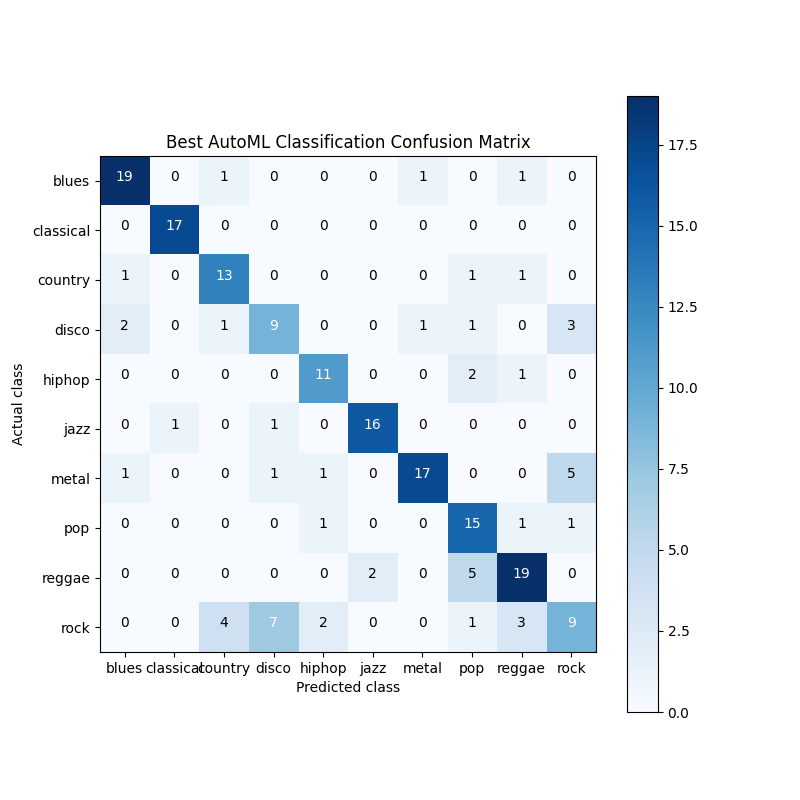

In [61]:
%matplotlib notebook
from sklearn.metrics import confusion_matrix
import itertools

plt.figure(figsize=(8, 8))
cf = confusion_matrix(y_test_automl, y_pred_automl)
plt.imshow(cf,cmap=plt.cm.Blues, interpolation='nearest')
plt.colorbar()
plt.title('Best AutoML Classification Confusion Matrix')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')

class_labels = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels)
plt.yticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], 
           ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock'])

thresh = cf.max() / 3.

for i,j in itertools.product(range(cf.shape[0]),range(cf.shape[1])):
    plt.text(j,i,format(cf[i,j],'d'), horizontalalignment='center', color='white' if cf[i,j] >thresh else 'black')
plt.show()

In [62]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

print(classification_report(y_test_automl, y_pred_automl, target_names=class_labels, digits = 3))

              precision    recall  f1-score   support

       blues      0.826     0.864     0.844        22
   classical      0.944     1.000     0.971        17
     country      0.684     0.812     0.743        16
       disco      0.500     0.529     0.514        17
      hiphop      0.733     0.786     0.759        14
        jazz      0.889     0.889     0.889        18
       metal      0.895     0.680     0.773        25
         pop      0.600     0.833     0.698        18
      reggae      0.731     0.731     0.731        26
        rock      0.500     0.346     0.409        26

    accuracy                          0.729       199
   macro avg      0.730     0.747     0.733       199
weighted avg      0.729     0.729     0.723       199



In [63]:
automlaccuracy = accuracy_score(y_test_automl, y_pred_automl)

> The Best AutoML model accuracy is higher than the decision trees model

In [64]:
print("Best AutoML Accuracy =", round(automlaccuracy, 4))
print("Decision Tree Accuracy =", round(dtaccuracy, 4))
ratio = ((automlaccuracy  / dtaccuracy) - 1 ) * 100
print("Gain =", (round(ratio, 2)), '%')

Best AutoML Accuracy = 0.7286
Decision Tree Accuracy = 0.475
Gain = 53.4 %


## 13. Let's classify music genre prediction from an audio file

In [65]:
os.listdir('Tests')

['.ipynb_checkpoints',
 'testfile1.wav',
 'testfile2.wav',
 'testfile3.wav',
 'testfile4.wav']

In [66]:
def callingmodel(audiofile):
    y, sr = librosa.load(audiofile)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    tempo, beat_frames = librosa.beat.beat_track(y=y_harmonic, sr=sr)

    beat_times = librosa.frames_to_time(beat_frames, sr=sr)
    beat_time_diff=np.ediff1d(beat_times)
    beat_nums = np.arange(1, np.size(beat_times))
    chroma=librosa.feature.chroma_cens(y=y_harmonic, sr=sr)
    mfccs = librosa.feature.mfcc(y=y_harmonic, sr=sr, n_mfcc=13)
    cent = librosa.feature.spectral_centroid(y=y, sr=sr)
    contrast=librosa.feature.spectral_contrast(y=y_harmonic,sr=sr)
    rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
    zrate=librosa.feature.zero_crossing_rate(y_harmonic)
    chroma_mean=np.mean(chroma,axis=1)
    chroma_std=np.std(chroma,axis=1)
    octave=['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']

    chroma_df=pd.DataFrame()

    for i in range(0,12):
        chroma_df['chroma_mean_'+str(i)]=chroma_mean[i]
    for i in range(0,12):
        chroma_df['chroma_std_'+str(i)]=chroma_mean[i]
    chroma_df.loc[0]=np.concatenate((chroma_mean,chroma_std),axis=0)
    mfccs_mean=np.mean(mfccs,axis=1)
    mfccs_std=np.std(mfccs,axis=1)

    coeffs=np.arange(0,13)

    mfccs_df=pd.DataFrame()
    for i in range(0,13):
        mfccs_df['mfccs_mean_'+str(i)]=mfccs_mean[i]
    for i in range(0,13):
        mfccs_df['mfccs_std_'+str(i)]=mfccs_mean[i]
    mfccs_df.loc[0]=np.concatenate((mfccs_mean,mfccs_std),axis=0)

    cent_mean=np.mean(cent)
    cent_std=np.std(cent)
    cent_skew=scipy.stats.skew(cent,axis=1)[0]

    contrast_mean=np.mean(contrast,axis=1)
    contrast_std=np.std(contrast,axis=1)
    conts=np.arange(0,7)
    contrast_df=pd.DataFrame()

    rolloff_mean=np.mean(rolloff)
    rolloff_std=np.std(rolloff)
    rolloff_skew=scipy.stats.skew(rolloff,axis=1)[0]

    spectral_df=pd.DataFrame()
    collist=['cent_mean','cent_std','cent_skew']
    for i in range(0,7):
        collist.append('contrast_mean_'+str(i))
    for i in range(0,7):
        collist.append('contrast_std_'+str(i))
        collist=collist+['rolloff_mean','rolloff_std','rolloff_skew']
    for c in collist:
        spectral_df[c]=0
        data=np.concatenate(([cent_mean,cent_std,cent_skew],contrast_mean,contrast_std,[rolloff_mean,rolloff_std,rolloff_std]),
                    axis=0)
    spectral_df.loc[0]=data

    zrate_mean=np.mean(zrate)
    zrate_std=np.std(zrate)
    zrate_skew=scipy.stats.skew(zrate,axis=1)[0]

    zrate_df=pd.DataFrame()
    zrate_df['zrate_mean']=0
    zrate_df['zrate_std']=0
    zrate_df['zrate_skew']=0
    zrate_df.loc[0]=[zrate_mean,zrate_std,zrate_skew]

    beat_df=pd.DataFrame()
    beat_df['tempo']=tempo
    beat_df.loc[0]=tempo

    sr_df = pd.DataFrame({'sampling_rate': [sr]})
    totalsamples = np.size(y)
    duration = totalsamples / sr
    totalsamples_df = pd.DataFrame({'total_samples': [totalsamples]})
    duration_df = pd.DataFrame({'duration': [duration]})

    audiofeatures_soundfile = pd.concat((chroma_df, mfccs_df, spectral_df, zrate_df, beat_df),axis=1)
    
    print("Audio features from the file:\n")
    pd.set_option('max_columns', None)
    audiofeatures_soundfile
    
    # Calling the deployed model
    t1 = datetime.datetime.now()
    audiofeatures_soundfile_json = audiofeatures_soundfile.to_json(orient='records')

    data = "{\"data\": " + audiofeatures_soundfile_json +"}"
    headers = {'Content-Type': 'application/json'}

    resp = requests.post(aci_service.scoring_uri, data, headers=headers) # Calling the ACI deployed model
    musicgenrepred = json.loads(json.loads(resp.text))['result']

    t2 = datetime.datetime.now()
    print("\033[1;31;34mMusic Genre prediction of:", audiofile)
    print(">> Prediction:", str.upper(musicgenrepred[0]))
    print("\nDone in", t2 - t1)

In [67]:
audiofile = "tests/classical.wav"
IPython.display.Audio(audiofile)

In [68]:
callingmodel(audiofile)

Audio features from the file:

Music Genre prediction of: tests/testfile1.wav
>> Prediction: GENRES/CLASSICAL

Done in 0:00:00.577405


In [69]:
audiofile = "tests/metal.wav"
IPython.display.Audio(audiofile)

In [70]:
callingmodel(audiofile)

Audio features from the file:

Music Genre prediction of: tests/testfile2.wav
>> Prediction: GENRES/METAL

Done in 0:00:00.589565


In [71]:
audiofile = "tests/jazz.wav"
IPython.display.Audio(audiofile)

In [72]:
callingmodel(audiofile)

Audio features from the file:

Music Genre prediction of: tests/testfile3.wav
>> Prediction: GENRES/JAZZ

Done in 0:00:00.552041


## 14. Delete the Web Service (if needed)
Deletes the specified web service.

In [ ]:
#aci_service.delete()

> End